<h1>Computational Neuroscience Experiment 4</h1>
<h3>Roshan Srivastava

J047

MBA Tech. EXTC SEM 8</h3>

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import warnings
from scipy.signal import hamming,hanning,blackman
warnings.filterwarnings('ignore')

columns = ['FP2-A2 ', 'F8 -A2 ', 'T4 -A2 ', 'T6 -A2 ', 'F4 -A2 ', 'C4 -A2 ',
       'P4 -A2 ', 'O2 -A2 ', 'FP1-A1 ', 'F7 -A1 ', 'T3 -A1 ', 'T5 -A1 ',
       'F3 -A1 ', 'C3 -A1 ', 'P3 -A1 ', 'O1 -A1 ', 'FZ -A2 ', 'CZ -A1 ',
       'PZ -A2 ', 'BP1-REF', 'BP2-REF']
division_factor = 128.2

<h1>Time Plots</h1>

In [43]:
def time_charts(file,sup):
    data = pd.read_csv(file)
    colormap = plt.cm.viridis
    colors = [colormap(i) for i in np.linspace(0, 1,30)]
    plt.figure(figsize=(30,70),constrained_layout=True)
    for i in range(len(data.columns)):
        plt.subplot(7,3,i+1)
        data[columns[i]].plot(color=colors[i])
        plt.xlabel("Samples")
        plt.ylabel("Magnitude")
        plt.title(f"{columns[i]} Time Plot")
    plt.suptitle(sup, fontsize=37)
    plt.show()  


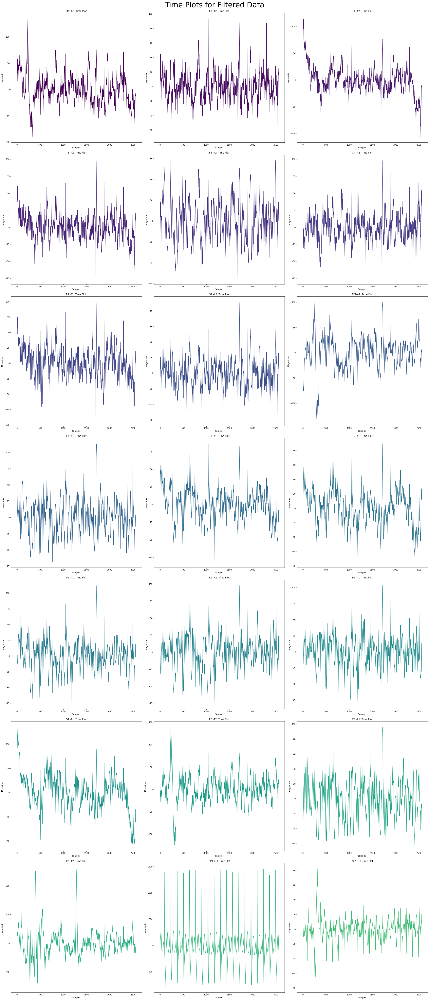

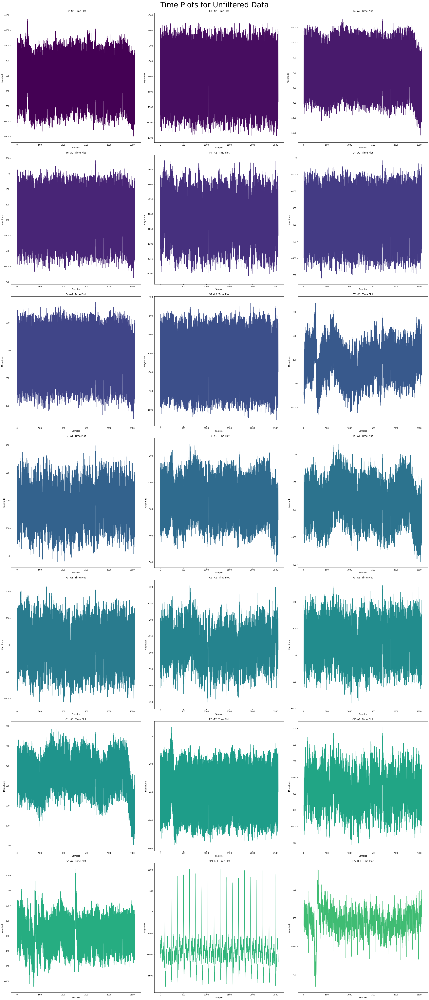

In [44]:
time_charts('5_filtered.csv',"Time Plots for Filtered Data")
time_charts('5_unfiltered.csv',"Time Plots for Unfiltered Data")

<h1>Frequency Plots</h1>

In [4]:
def fft(arr):
  arr = np.asarray(arr, dtype=float)
  n = np.arange(arr.shape[0])
  k = n.reshape((arr.shape[0], 1))
  M = np.exp(-2j * np.pi * k * n / arr.shape[0])
  return np.dot(M, arr)

In [82]:
def freq_chart(file,sup):
  df = pd.read_csv(file, index_col = False, header = None)
  df = df.iloc[2: , :]
  df.dropna()
  channels = [0,4,8,16,32,99]
  channel_names = ['Delta (0.5-4 Hz)','Theta (4-8 Hz)','Alpha (8-16 Hz)','Beta (16-32 Hz)','Gamma (32-99 Hz)']

  N = 2560
  T = 1/256
  xf = np.linspace(0, 1/(2*T), N//2)
  yf = df.apply(fft)
  yf /= division_factor
  yf = np.abs(yf)

  plt.figure(figsize=(30,70),constrained_layout=True)
  for i in range(len(df.columns)):
    plt.subplot(7,3,i+1)
    for j in range(len(channels)-1):
      intervals = np.where(np.where(np.logical_and(xf>channels[j], xf<channels[j+1]),1,0)==1)[0][[0,-1]]
      if channels[j]==0:
        plt.plot(xf[intervals[0]:intervals[1]], yf.iloc[intervals[0]:intervals[1],i])
      else:
        plt.plot(xf[intervals[0]-1:intervals[1]], yf.iloc[intervals[0]-1:intervals[1],i])
    plt.title(f'{columns[i]}')
    plt.xlabel('Frequency')
    plt.ylabel('Spectral Amplitude')
    plt.legend(labels = channel_names)
  plt.suptitle(sup, fontsize=37)
  plt.show()
  

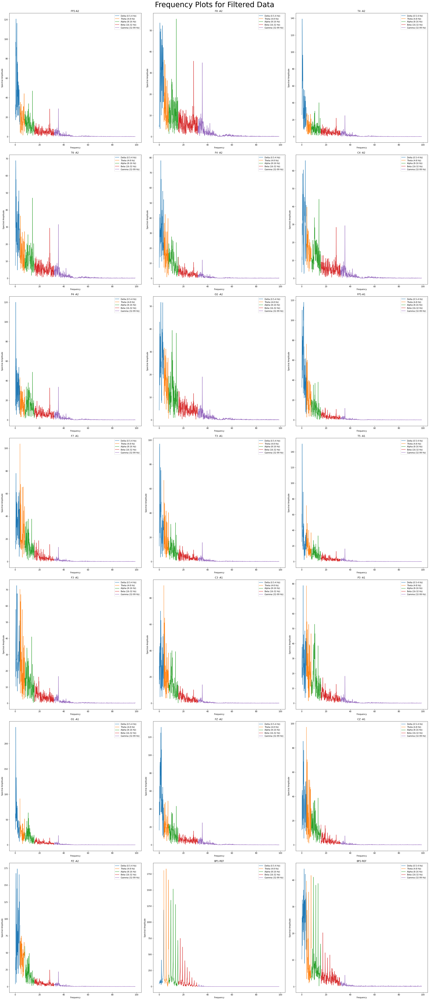

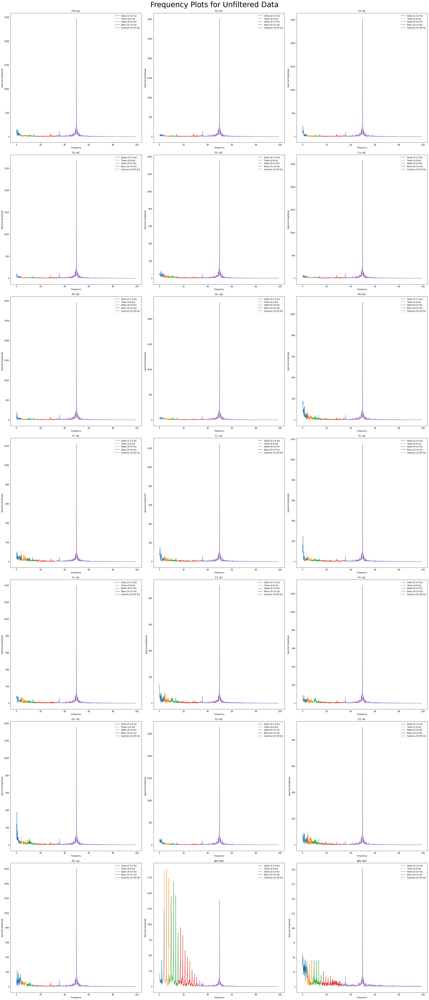

In [83]:
freq_chart('5_filtered.csv',"Frequency Plots for Filtered Data")
freq_chart('5_unfiltered.csv',"Frequency Plots for Unfiltered Data")

<h1>Part 3: Filtering Data</h1>

In [84]:
def wind_freq_chart(file,sup,filter_):
  df = pd.read_csv(file, index_col = False, header = None)
  df = df.iloc[2: , :]
  df.dropna()
  channels = [0,4,8,16,32,99]
  channel_names = ['Delta (0.5-4 Hz)','Theta (4-8 Hz)','Alpha (8-16 Hz)','Beta (16-32 Hz)','Gamma (32-99 Hz)']

  N = 2560
  T = 1/256
  xf = np.linspace(0, 1/(2*T), N//2)
  yf = df.apply(fft)
  yf /= division_factor
  yf = pd.DataFrame(np.multiply(yf.T,eval(f"{filter_}(yf.shape[0])")).T)
  yf = np.abs(yf)

  plt.figure(figsize=(30,70),constrained_layout=True)
  for i in range(len(df.columns)):
    plt.subplot(7,3,i+1)
    for j in range(len(channels)-1):
      intervals = np.where(np.where(np.logical_and(xf>channels[j], xf<channels[j+1]),1,0)==1)[0][[0,-1]]
      if channels[j]==0:
        plt.plot(xf[intervals[0]:intervals[1]], yf.iloc[intervals[0]:intervals[1],i])
      else:
        plt.plot(xf[intervals[0]-1:intervals[1]], yf.iloc[intervals[0]-1:intervals[1],i])
    plt.title(f'{columns[i]}')
    plt.xlabel('Frequency')
    plt.ylabel('Spectral Amplitude')
    plt.legend(labels = channel_names)
  plt.suptitle(sup, fontsize=37)
  plt.show()

<h2>Hamming Window</h2>

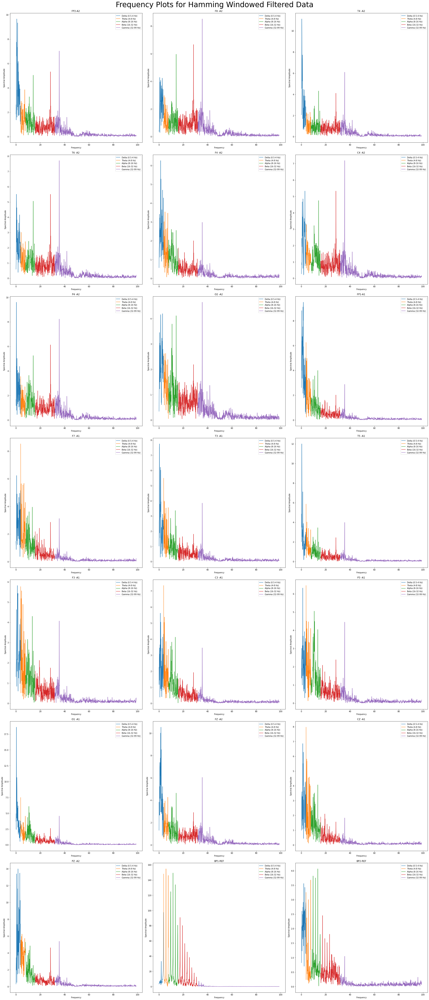

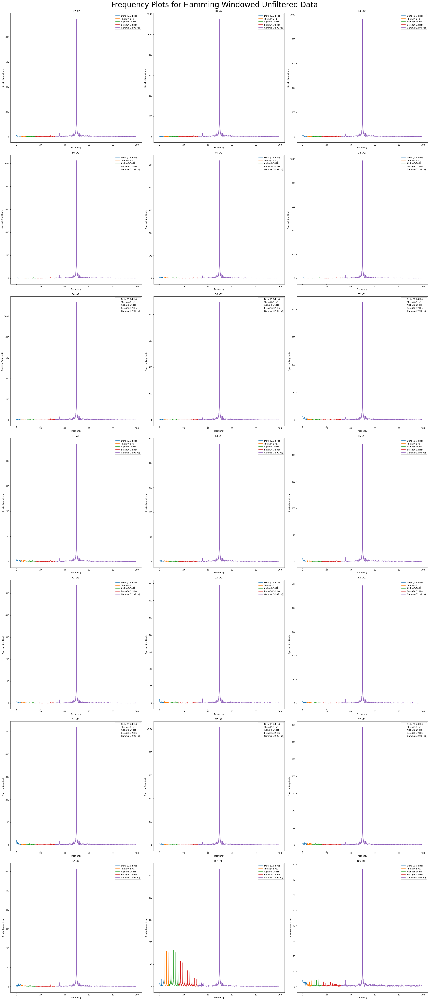

In [79]:
wind_freq_chart('5_filtered.csv',"Frequency Plots for Hamming Windowed Filtered Data",'hamming')
wind_freq_chart('5_unfiltered.csv',"Frequency Plots for Hamming Windowed Unfiltered Data","hamming")

<h2>Hanning Window</h2>

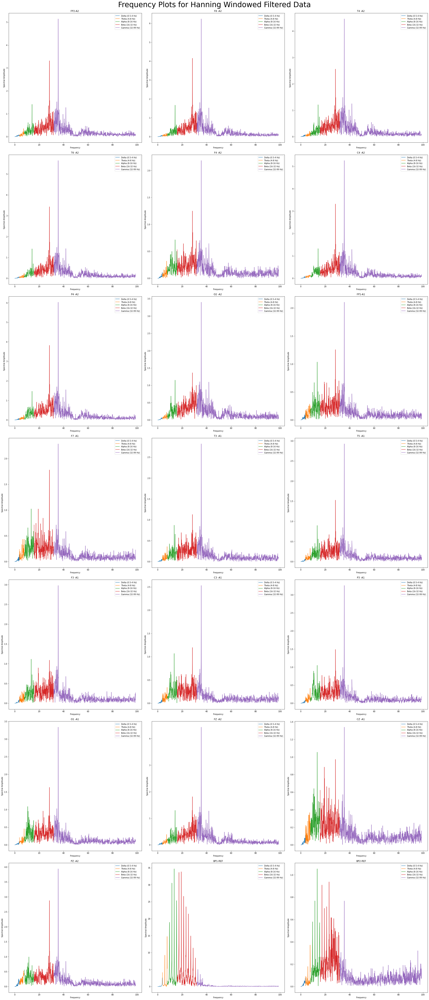

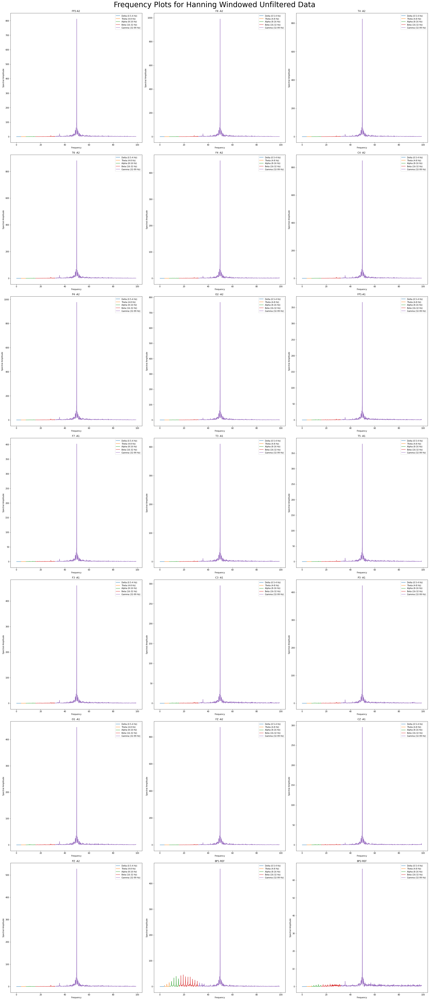

In [80]:
wind_freq_chart('5_filtered.csv',"Frequency Plots for Hanning Windowed Filtered Data",'hanning')
wind_freq_chart('5_unfiltered.csv',"Frequency Plots for Hanning Windowed Unfiltered Data","hanning")

<h2>Blackman Window</h2>

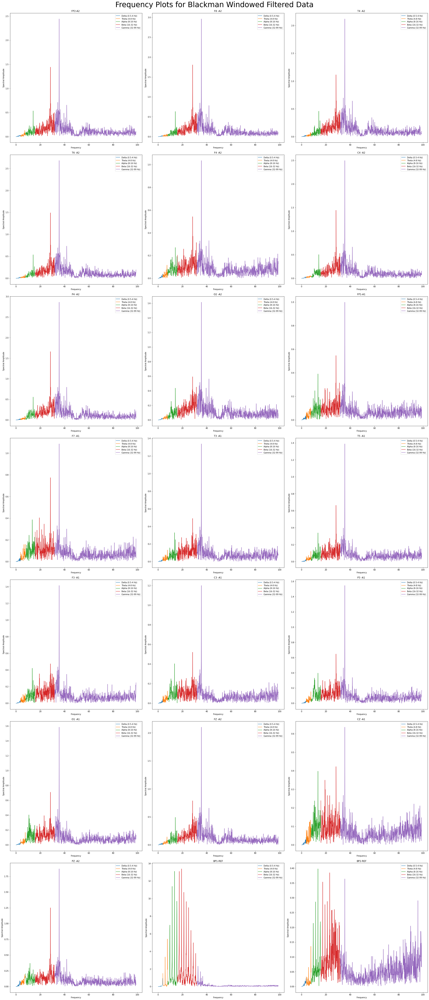

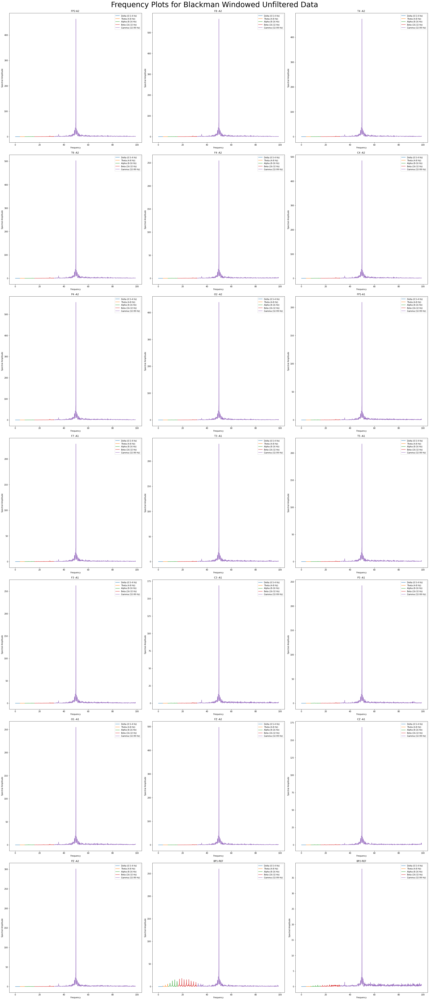

In [81]:
wind_freq_chart('5_filtered.csv',"Frequency Plots for Blackman Windowed Filtered Data",'blackman')
wind_freq_chart('5_unfiltered.csv',"Frequency Plots for Blackman Windowed Unfiltered Data","blackman")